#### Ozone contains the daily air quality summary statistics by monitor for the state of California for 2024. Each row contains the date and the air quality metrics per collection method and site
- "Date" - the calendar date with which the air quality values are associated
- "Source" - the data source: EPA's Air Quality System (AQS), or Airnow reports
- "Site ID" - the id for the air monitoring site
- "POC" - the id number for the monitor
- "Daily Max 8-hour Ozone Concentration" - the highest 8-hour value of the day for ozone concentration
- "Units" - parts per million by volume (ppm)
- "Daily AQI Value" - the highest air quality index value for the day, telling how clean or polluted the air is (a value of 50 represents good air quality, while a value above 300 is hazardous)
- "Local Site Name" - name of the monitoring site
- "Daily Obs Count" - number of observations reported in that day
- "Percent Complete" - indicates whether all expected samples were collected
- "Method Code" - identifier for the collection method
- "CBSA Code" - identifier for the core base statistical area (CBSA)
- "CBSA Name" - name of the core base statistical area
- "State FIPS Code" - identifier for the state
- "State" - name of the state
- "County FIPS Code" - identifer for the county
- "County" - name of the county
- "Site Latitude" - latitude coordinates of the site
- "Site Longitude" - longitude coordinates of the side

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
ozone = pd.read_csv('data/ozone.csv')
ozone.head()

,Date,Source,Site ID,POC,Daily Max 8-hour Ozone Concentration,Units,Daily AQI Value,Local Site Name,Daily Obs Count,Percent Complete,Method Code,CBSA Code,CBSA Name,County FIPS Code,County,Site Latitude,Site Longitude
0,/2024,AQS,60010007,1,0.031,ppm,29.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
1,01/02/2024,AQS,60010007,1,0.037,ppm,34.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
2,/2024,AQS,60010007,1,NaN,ppm,30.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
3,January 04/2024,AQS,60010007,1,0.026,ppm,24.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
4,January 05/2024,AQS,60010007,1,0.027,ppm,25.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217


# **Data Understanding**

In [3]:
ozone.shape

(54759, 17)

In [4]:
ozone.columns

Index(['Date', 'Source', 'Site ID', 'POC',
       'Daily Max 8-hour Ozone Concentration', 'Units', 'Daily AQI Value',
       'Local Site Name', 'Daily Obs Count', 'Percent Complete', 'Method Code',
       'CBSA Code', 'CBSA Name', 'County FIPS Code', 'County', 'Site Latitude',
       'Site Longitude'],
      dtype='object')

In [5]:
ozone.describe()

,Site ID,POC,Daily Max 8-hour Ozone Concentration,Daily AQI Value,Daily Obs Count,Percent Complete,Method Code,CBSA Code,County FIPS Code,Site Latitude,Site Longitude
count,5.475900e+04,54759.000000,52021.000000,52021.000000,54759.000000,54759.000000,48269.000000,52351.000000,54759.000000,54759.000000,54759.000000
mean,6.059086e+07,1.000256,0.043519,45.280079,27.534688,99.340346,89.051669,36107.577697,58.918406,36.169550,-119.665107
std,3.001943e+05,0.015988,0.014610,25.899065,97.800446,3.658452,36.636778,9536.717562,30.012874,2.192841,2.022987
min,6.001001e+07,1.000000,0.000000,0.000000,1.000000,6.000000,47.000000,12540.000000,1.000000,32.578165,-124.179490
25%,6.031100e+07,1.000000,0.034000,31.000000,17.000000,100.000000,87.000000,31080.000000,31.000000,34.181977,-121.420838
50%,6.065500e+07,1.000000,0.041000,38.000000,17.000000,100.000000,87.000000,40140.000000,65.000000,36.209286,-119.828400
75%,6.081100e+07,1.000000,0.052000,48.000000,17.000000,100.000000,87.000000,41860.000000,81.000000,37.961578,-118.068500
max,6.113100e+07,2.000000,0.139000,236.000000,1000.000000,100.000000,199.000000,49700.000000,113.000000,41.726892,-114.602090


In [6]:
ozone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54759 entries, 0 to 54758
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date                                  54759 non-null  object 
 1   Source                                54759 non-null  object 
 2   Site ID                               54759 non-null  int64  
 3   POC                                   54759 non-null  int64  
 4   Daily Max 8-hour Ozone Concentration  52021 non-null  float64
 5   Units                                 54759 non-null  object 
 6   Daily AQI Value                       52021 non-null  float64
 7   Local Site Name                       54759 non-null  object 
 8   Daily Obs Count                       54759 non-null  int64  
 9   Percent Complete                      54759 non-null  float64
 10  Method Code                           48269 non-null  float64
 11  CBSA Code      

In [7]:
ozone["Source"].unique()

array(['AQS', 'AirNow'], dtype=object)

In [8]:
ozone["County"].unique()

array(['Alameda', 'Amador', 'Butte', 'Calaveras', 'Colusa',
       'Contra Costa', 'El Dorado', 'Fresno', 'Glenn', 'Humboldt',
       'Imperial', 'Inyo', 'Kern', 'Kings', 'Lake', 'Los Angeles', 'LA',
       'Madera', 'Marin', 'Mariposa', 'Mendocino', 'Merced', 'Monterey',
       'Nevada', 'Orange', 'Placer', 'Riverside', 'Sacramento',
       'San Benito', 'San Bernardino', 'San Diego', 'San Francisco', 'SF',
       'San Joaquin', 'San Luis Obispo', 'San Mateo', 'Santa Barbara',
       'Santa Clara', 'Santa Cruz', 'Shasta', 'Siskiyou', 'Solano',
       'Sonoma', 'Stanislaus', 'Sutter', 'Tehama', 'Tulare', 'Tuolumne',
       'Ventura', 'Yolo'], dtype=object)

In [9]:
ozone["CBSA Name"].unique()

array(['San Francisco-Oakland-Hayward, CA', nan, 'Chico, CA',
       'Sacramento--Roseville--Arden-Arcade, CA', 'Fresno, CA',
       'Eureka-Arcata-Fortuna, CA', 'El Centro, CA', 'Bishop, CA',
       'Bakersfield, CA', 'Hanford-Corcoran, CA', 'Clearlake, CA',
       'Los Angeles-Long Beach-Anaheim, CA', 'Madera, CA', 'Ukiah, CA',
       'Merced, CA', 'Salinas, CA', 'Truckee-Grass Valley, CA',
       'Riverside-San Bernardino-Ontario, CA',
       'San Jose-Sunnyvale-Santa Clara, CA', 'San Diego-Carlsbad, CA',
       'Stockton-Lodi, CA',
       'San Luis Obispo-Paso Robles-Arroyo Grande, CA',
       'Santa Maria-Santa Barbara, CA', 'Santa Cruz-Watsonville, CA',
       'Redding, CA', 'Vallejo-Fairfield, CA', 'Santa Rosa, CA',
       'Modesto, CA', 'Yuba City, CA', 'Red Bluff, CA',
       'Visalia-Porterville, CA', 'Sonora, CA',
       'Oxnard-Thousand Oaks-Ventura, CA'], dtype=object)

In [10]:
ozone["Local Site Name"].unique()

array(['Livermore', 'Oakland', 'Oakland West', 'Berkeley- Aquatic Park',
       'Livermore Portola', 'Hayward', 'Jackson-Clinton Road',
       'Chico-East Avenue', 'Paradise-Clark',
       'San Andreas-Gold Strike Road', 'Colusa-Sunrise Blvd', 'Concord',
       'Bethel Island', 'San Pablo', 'San Ramon', 'Echo Summit', 'Cool',
       'PLACERVILLE- CANAL STREET', 'Fresno-Drummond', 'Fresno - Garland',
       'Fresno-Sky Park', 'Table Mountain Air Monitoring Site',
       'Tranquillity', 'Parlier', 'Clovis-Villa', 'Willows-Colusa Street',
       'Jacobs', 'Calexico-Ethel Street', 'El Centro-9th Street',
       'Westmorland', 'Niland-English Road', 'WMRC/NCORE',
       'Death Valley NP - Park Village', 'Bishop Tribe EMO', 'Edison',
       'Maricopa', 'Bakersfield-California', 'Mojave-Pat Avenue',
       'Oildale', 'Bakersfield-Muni', 'Arvin-Di Giorgio', 'Shafter',
       'Hanford-Irwin', 'Lakeport-S. Main Street', 'Glendora',
       'West Los Angeles', 'Los Angeles-North Main Street', 'Res

# **Handling Data Types & Formats**

In [11]:
# convert Date to datetime 
ozone['Date'] = pd.to_datetime(ozone['Date'], errors='coerce')

In [12]:
# handle the value errors
for i in range(1, len(ozone)):
    current = ozone.loc[i,'Date']
    
    if current.month == 1 and current.day == 1:
        prev_date = ozone.loc[i - 1, 'Date']
        new_date = prev_date + pd.Timedelta(days=1)
        ozone.loc[i, 'Date'] = new_date

In [13]:
# create new features ["Month","DayOfWeek"]
ozone['Month'] = ozone['Date'].dt.month
ozone['DayOfWeek'] = ozone['Date'].dt.dayofweek

# **Handling Missing Values**

In [14]:
# Calculate the number of missing values in each column
ozone.isna().sum()

Date                                       0
Source                                     0
Site ID                                    0
POC                                        0
Daily Max 8-hour Ozone Concentration    2738
Units                                      0
Daily AQI Value                         2738
Local Site Name                            0
Daily Obs Count                            0
Percent Complete                           0
Method Code                             6490
CBSA Code                               2408
CBSA Name                               2408
County FIPS Code                           0
County                                     0
Site Latitude                              0
Site Longitude                             0
Month                                      0
DayOfWeek                                  0
dtype: int64

## **Missing Value Problem Description**  
There are Five columns has missing values

## **Columns can be handled:**
- `Daily Max 8-hour Ozone Concentration`
- `Daily AQI Value`
- `Method Code`
- `CBSA Code`
- `CBSA Name`

**we can use drop missing values in `Daily Max 8-hour Ozone Concentration` coulmn**

In [15]:
ozone = ozone.dropna(subset=['Daily Max 8-hour Ozone Concentration', 'Daily AQI Value'])

**we can replace missing values in `Daily AQI Value` column by the Daily AQI Value mean for each `Site ID`**

In [16]:
ozone['Daily AQI Value'] = ozone.groupby('Site ID')['Daily AQI Value'].transform(lambda x: x.fillna(x.mean()))

**we can replace missing values in [`CBSA Code`,`['CBSA Name`,`['Method Code`] column by it's mode for each `Site ID`**

In [17]:
ozone['CBSA Code'] = ozone.groupby('Site ID')['CBSA Code'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)
ozone['CBSA Name'] = ozone.groupby('Site ID')['CBSA Name'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)
ozone['Method Code'] = ozone.groupby('Site ID')['Method Code'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)

In [18]:
ozone.isna().sum()

Date                                       0
Source                                     0
Site ID                                    0
POC                                        0
Daily Max 8-hour Ozone Concentration       0
Units                                      0
Daily AQI Value                            0
Local Site Name                            0
Daily Obs Count                            0
Percent Complete                           0
Method Code                              526
CBSA Code                               2181
CBSA Name                               2181
County FIPS Code                           0
County                                     0
Site Latitude                              0
Site Longitude                             0
Month                                      0
DayOfWeek                                  0
dtype: int64

**we can replace missing values in [`CBSA Code`,`['CBSA Name`,`['Method Code`] column by it's mode for each `County`**

In [19]:
ozone['CBSA Code'] = ozone.groupby('County')['CBSA Code'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)
ozone['CBSA Name'] = ozone.groupby('County')['CBSA Name'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)
ozone['Method Code'] = ozone.groupby('County')['Method Code'].transform(lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x)

**drop any missing values found**

In [20]:
ozone.dropna(inplace=True)

In [21]:
ozone.isna().sum()

Date                                    0
Source                                  0
Site ID                                 0
POC                                     0
Daily Max 8-hour Ozone Concentration    0
Units                                   0
Daily AQI Value                         0
Local Site Name                         0
Daily Obs Count                         0
Percent Complete                        0
Method Code                             0
CBSA Code                               0
CBSA Name                               0
County FIPS Code                        0
County                                  0
Site Latitude                           0
Site Longitude                          0
Month                                   0
DayOfWeek                               0
dtype: int64

# **Handling Duplicates**

In [22]:
ozone.duplicated().sum()

288

In [23]:
ozone.drop_duplicates(inplace=True)

# **Handling Outliers**

In [24]:
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"Outliers detected in '{column}': {outliers.shape[0]}")
    
    ozone = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    print(f"After removing outliers in '{column}': {ozone.shape[0]} rows remain.")
    
    return ozone

ozone = remove_outliers_iqr(ozone, 'Daily Max 8-hour Ozone Concentration')
ozone = remove_outliers_iqr(ozone, 'Daily AQI Value')

Outliers detected in 'Daily Max 8-hour Ozone Concentration': 1145
After removing outliers in 'Daily Max 8-hour Ozone Concentration': 45805 rows remain.
Outliers detected in 'Daily AQI Value': 4416
After removing outliers in 'Daily AQI Value': 41389 rows remain.


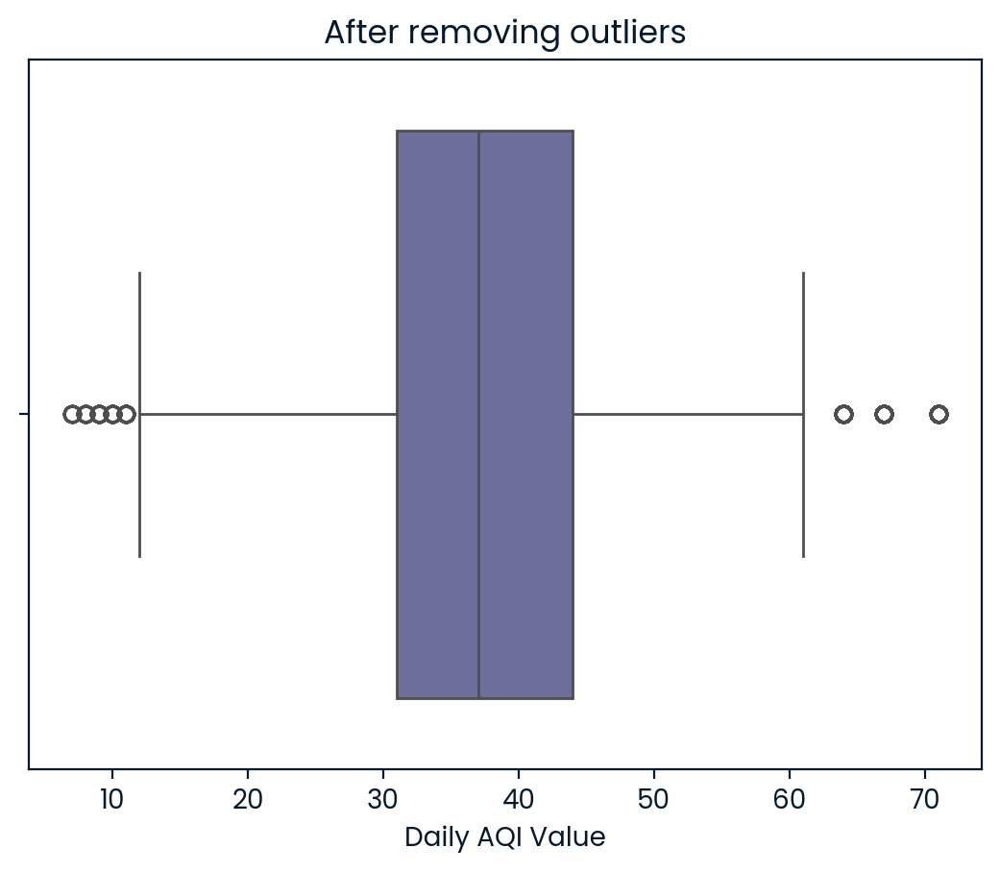

In [25]:
sns.boxplot(x=ozone['Daily AQI Value'])
plt.title("After removing outliers")
plt.show()

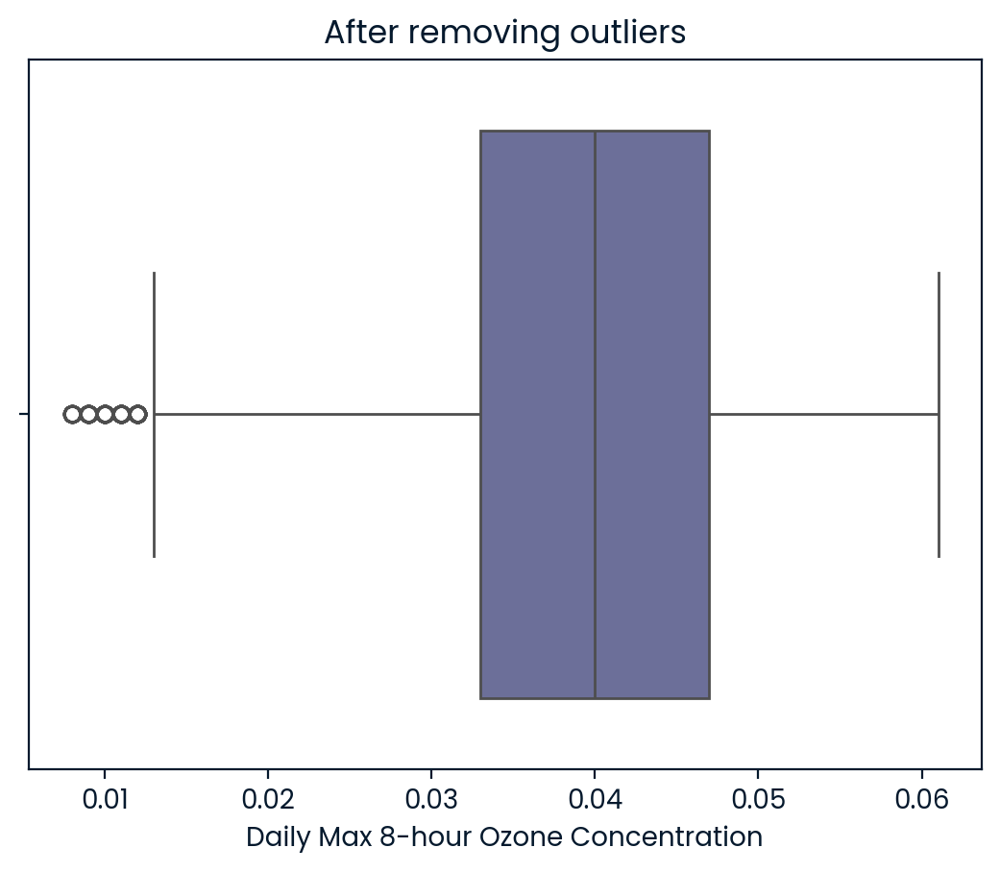

In [26]:
sns.boxplot(x=ozone['Daily Max 8-hour Ozone Concentration'])
plt.title("After removing outliers")
plt.show()

-----

# **Answer Analysis Questions**

## Q1. How does daily maximum 8-hour ozone concentration vary over time and regions?

In [27]:
fig = px.scatter_mapbox(
    ozone,
    lat="Site Latitude",
    lon="Site Longitude",
    color="Daily Max 8-hour Ozone Concentration",
    animation_frame=ozone['Date'].dt.strftime('%Y-%m-%d'),
    hover_name="Local Site Name",
    hover_data={
        "Daily AQI Value": True,
        "County": True,
        "Date": True,
        "Site Latitude": False,
        "Site Longitude": False
    },
    title='Ozone Concentration Over Time in California',
    color_continuous_scale="YlOrRd",
    zoom=5.5,
    height=700
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 36.7783, "lon": -119.4179},
    mapbox_zoom=5,
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.show()

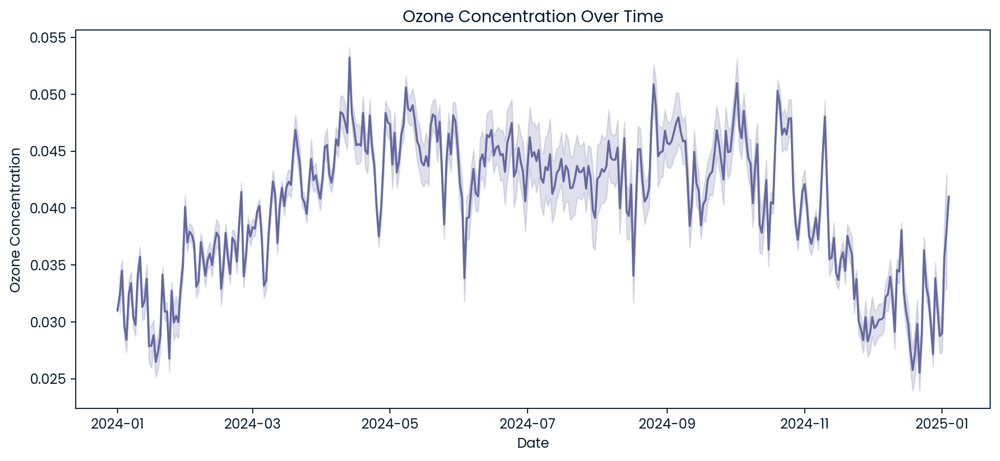

In [28]:
plt.figure(figsize=(12,5))
sns.lineplot(data = ozone, x = "Date", y = "Daily Max 8-hour Ozone Concentration")
plt.title("Ozone Concentration Over Time")
plt.xlabel("Date")
plt.ylabel("Ozone Concentration")
plt.show()

## Q2.Are there any areas that consistently show high ozone concentrations?

**We found that there is specific areas consistently exhibit high ozone concentrations. For example:**  
- El Centro, CA
- Riverside-San Bernardino-Ontario, CA
- San Diego-Carlsbad, CA
- Bishop, CA

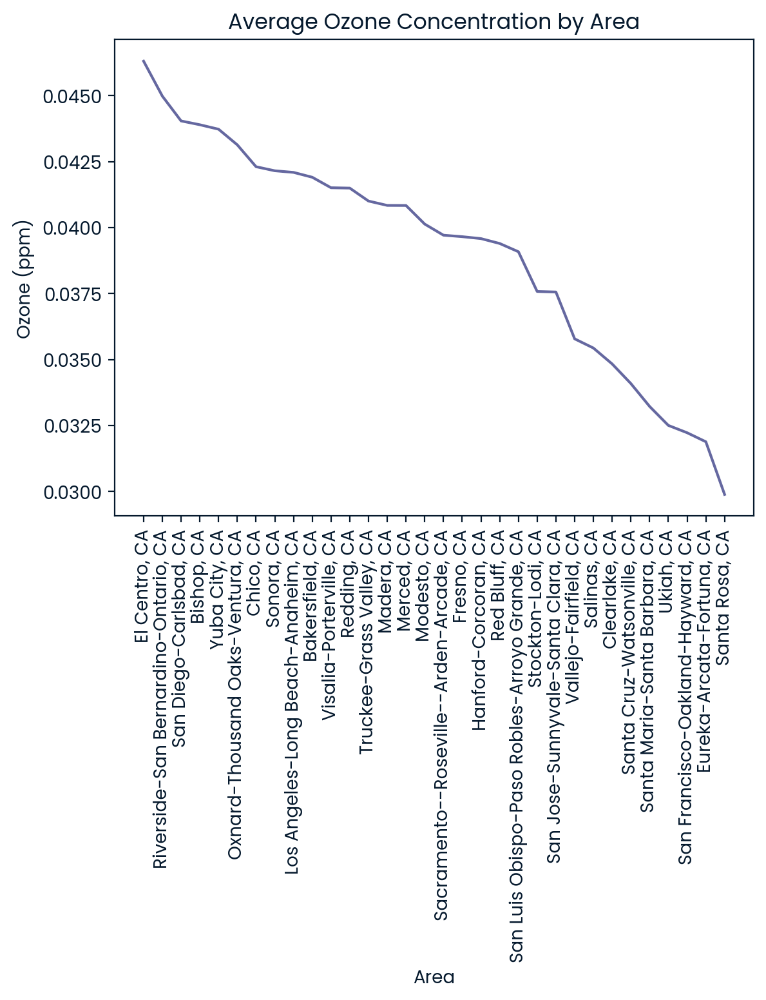

In [29]:
Area_avg = ozone.groupby('CBSA Name')['Daily Max 8-hour Ozone Concentration'].mean()
Area_avg = Area_avg.sort_values(ascending=False)

sns.lineplot(x=Area_avg.index, y=Area_avg.values, palette="pastel")
plt.title('Average Ozone Concentration by Area')
plt.xlabel('Area')
plt.xticks(rotation=90)
plt.ylabel('Ozone (ppm)')
plt.show()

## **Q3. Do different methods report different ozone levels?**

When comparing measurement methods (Method Code), we observed minor differences in reported ozone levels, though most methods provide similar trends.

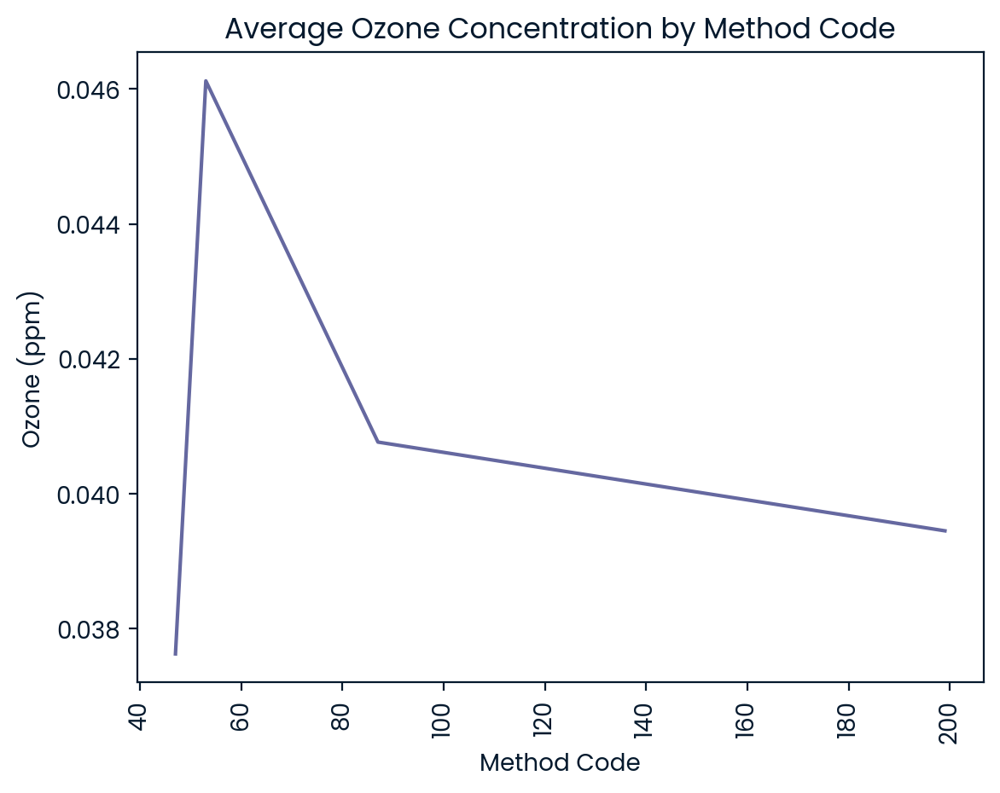

In [30]:
Method_avg = ozone.groupby('Method Code')['Daily Max 8-hour Ozone Concentration'].mean()
Method_avg = Method_avg.sort_values(ascending=False)

sns.lineplot(x=Method_avg.index, y=Method_avg.values, palette="pastel")
plt.title('Average Ozone Concentration by Method Code')
plt.xlabel('Method Code')
plt.xticks(rotation=90)
plt.ylabel('Ozone (ppm)')
plt.show()

## Q4.Consider if urban activity (weekend vs. weekday) has any affect on ozone levels across different days.


**To explore the impact of urban activity, we created a new column for day of the week and compared ozone levels on weekdays vs. weekends.**  

**Interestingly, we found that:**  
**- Weekends (sunday) tend to have slightly higher ozone concentrations.**



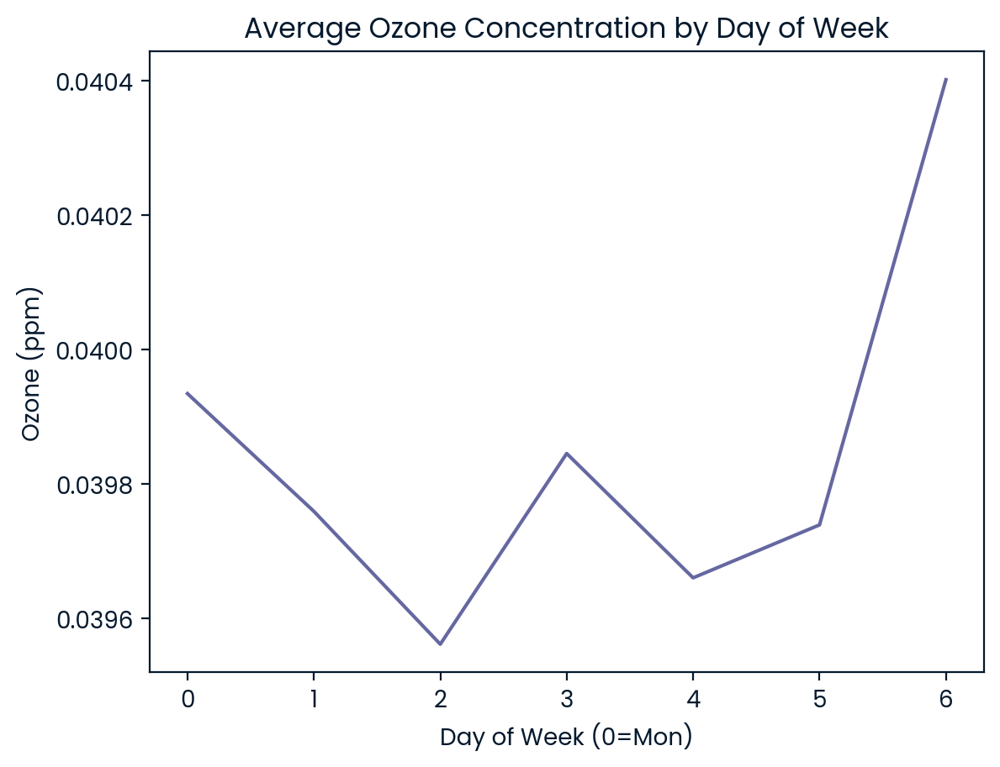

In [31]:
weekday_avg = ozone.groupby('DayOfWeek')['Daily Max 8-hour Ozone Concentration'].mean()

sns.lineplot(x=weekday_avg.index, y=weekday_avg.values, palette="pastel")
plt.title('Average Ozone Concentration by Day of Week')
plt.xlabel('Day of Week (0=Mon)')
plt.ylabel('Ozone (ppm)')
plt.show()

## **Additional Analysis**

In [32]:
ozone.head()

,Date,Source,Site ID,POC,Daily Max 8-hour Ozone Concentration,Units,Daily AQI Value,Local Site Name,Daily Obs Count,Percent Complete,Method Code,CBSA Code,CBSA Name,County FIPS Code,County,Site Latitude,Site Longitude,Month,DayOfWeek
0,2024-01-01,AQS,60010007,1,0.031,ppm,29.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217,1,0
1,2024-01-02,AQS,60010007,1,0.037,ppm,34.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217,1,1
3,2024-01-04,AQS,60010007,1,0.026,ppm,24.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217,1,3
4,2024-01-05,AQS,60010007,1,0.027,ppm,25.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217,1,4
5,2024-01-06,AQS,60010007,1,0.031,ppm,29.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217,1,5


In [33]:
# number of each value in Source
ozone["Source"].value_counts()

Source
AQS       35925
AirNow     5464
Name: count, dtype: int64

In [34]:
# group dataset by County and show the number of each value in Local Site Name 
ozone.groupby("County")["Local Site Name"].value_counts()

County   Local Site Name           
Alameda  Oakland West                  331
         Oakland                       303
         Berkeley- Aquatic Park        213
         Hayward                       193
         Livermore Portola             174
                                      ... 
Ventura  Piru - Pacific                316
         Thousand Oaks                 315
         Simi Valley-Cochran Street    284
Yolo     Woodland-Gibson Road          325
         Davis-UCD Campus              317
Name: count, Length: 167, dtype: int64

In [35]:
# top 10 most Local Site Name 
ozone["Local Site Name"].value_counts().head(10)

Local Site Name
King City 2                              336
El Rio-Rio Mesa School #2                334
Santa Barbara                            334
Santa Cruz                               333
Carmel Valley                            332
Paso Robles                              332
Oakland West                             331
Carpinteria                              330
San Diego - Sherman Elementary School    328
Morro Bay Kings Ave                      327
Name: count, dtype: int64

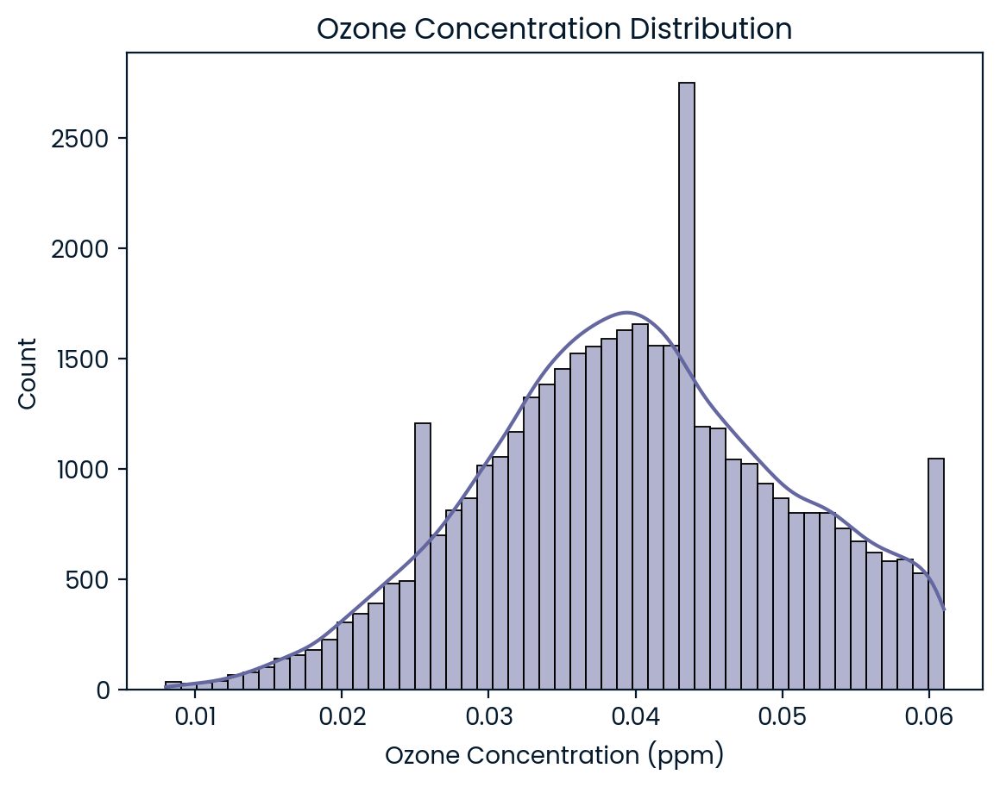

In [36]:
# Ozone Concentration Distribution
sns.histplot(ozone['Daily Max 8-hour Ozone Concentration'], bins=50, kde=True)
plt.title('Ozone Concentration Distribution')
plt.xlabel('Ozone Concentration (ppm)')
plt.show()

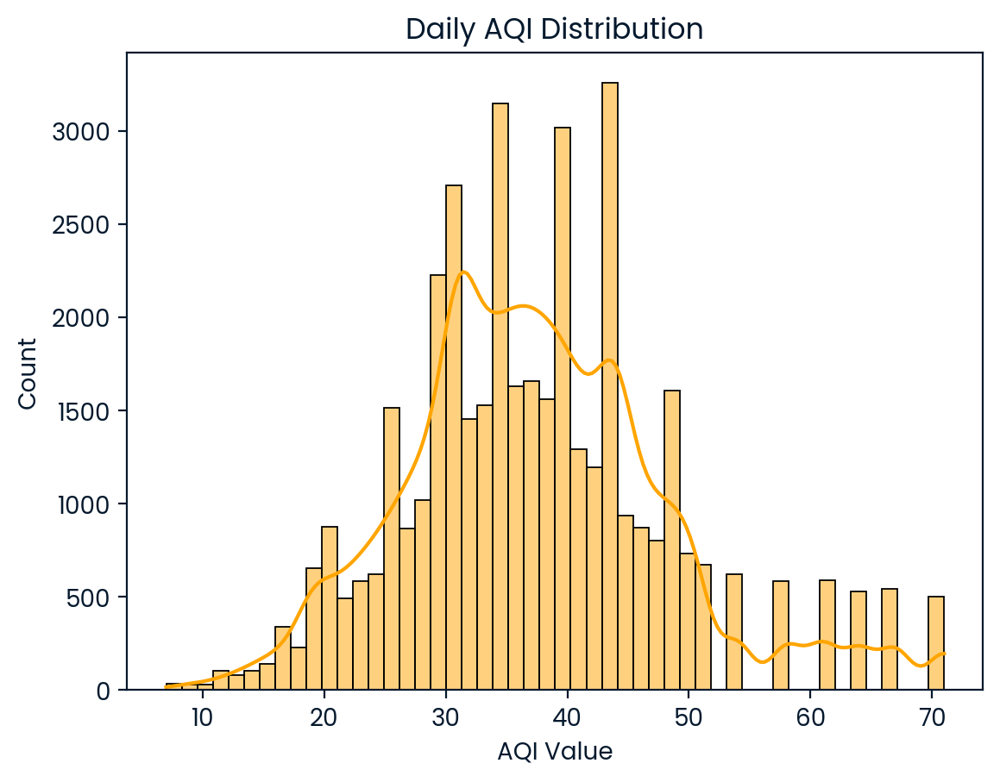

In [37]:
# Daily AQI Distribution
sns.histplot(ozone['Daily AQI Value'], bins=50, kde=True, color='orange')
plt.title('Daily AQI Distribution')
plt.xlabel('AQI Value')
plt.show()


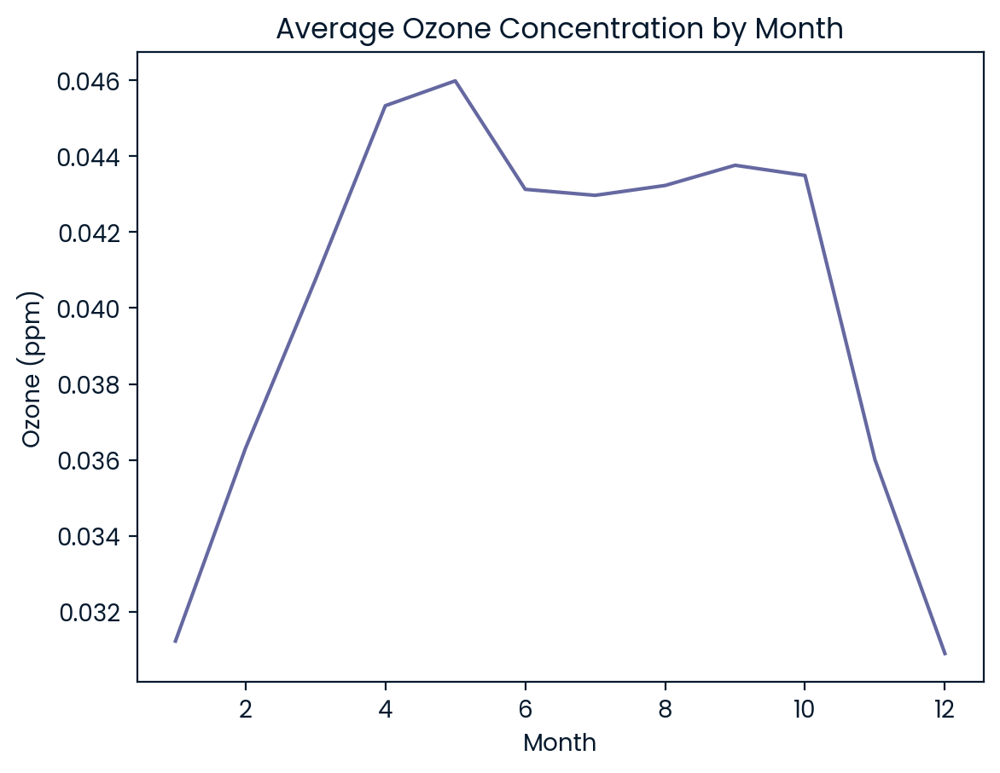

In [38]:
monthly_avg = ozone.groupby('Month')['Daily Max 8-hour Ozone Concentration'].mean()

sns.lineplot(x=monthly_avg.index, y=monthly_avg.values)
plt.title('Average Ozone Concentration by Month')
plt.xlabel('Month')
plt.ylabel('Ozone (ppm)')
plt.show()

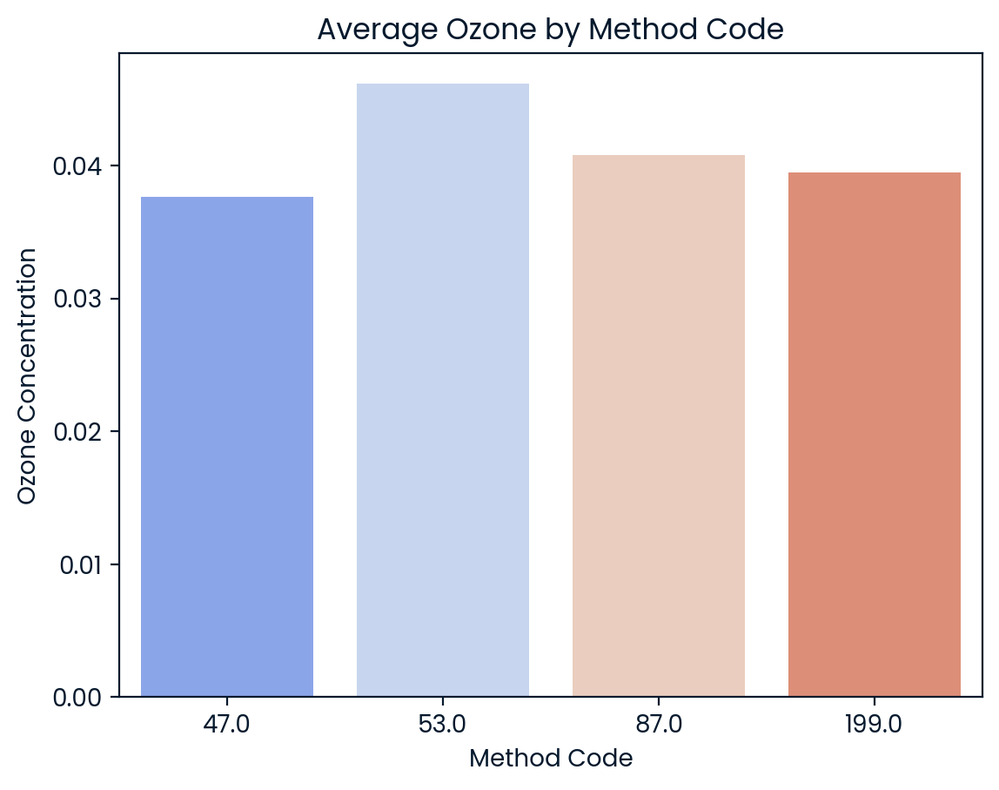

In [39]:
method_avg = ozone.groupby('Method Code')['Daily Max 8-hour Ozone Concentration'].mean().sort_values(ascending=False)

sns.barplot(x=method_avg.index, y=method_avg.values, palette = "coolwarm")
plt.title("Average Ozone by Method Code")
plt.ylabel("Ozone Concentration")
plt.xlabel("Method Code")
plt.show()

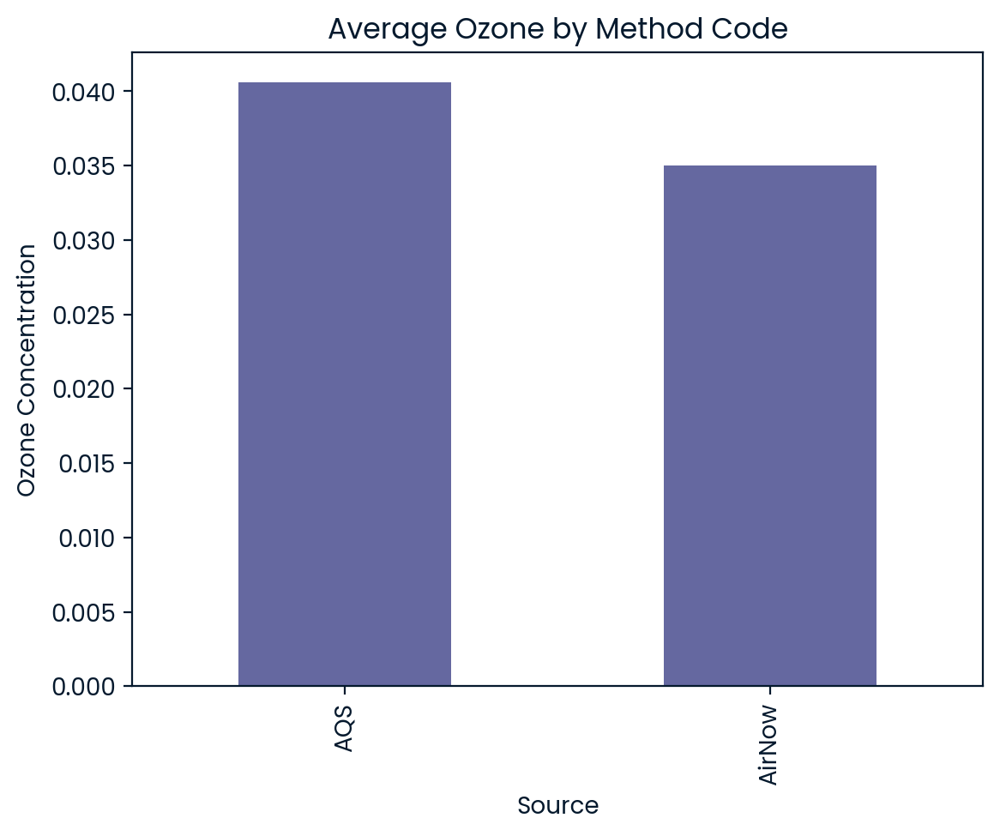

In [40]:
source_avg = ozone.groupby('Source')['Daily Max 8-hour Ozone Concentration'].mean().sort_values(ascending=False)

source_avg.plot(kind='bar')
plt.title("Average Ozone by Method Code")
plt.ylabel("Ozone Concentration")
plt.xlabel("Source")
plt.show()

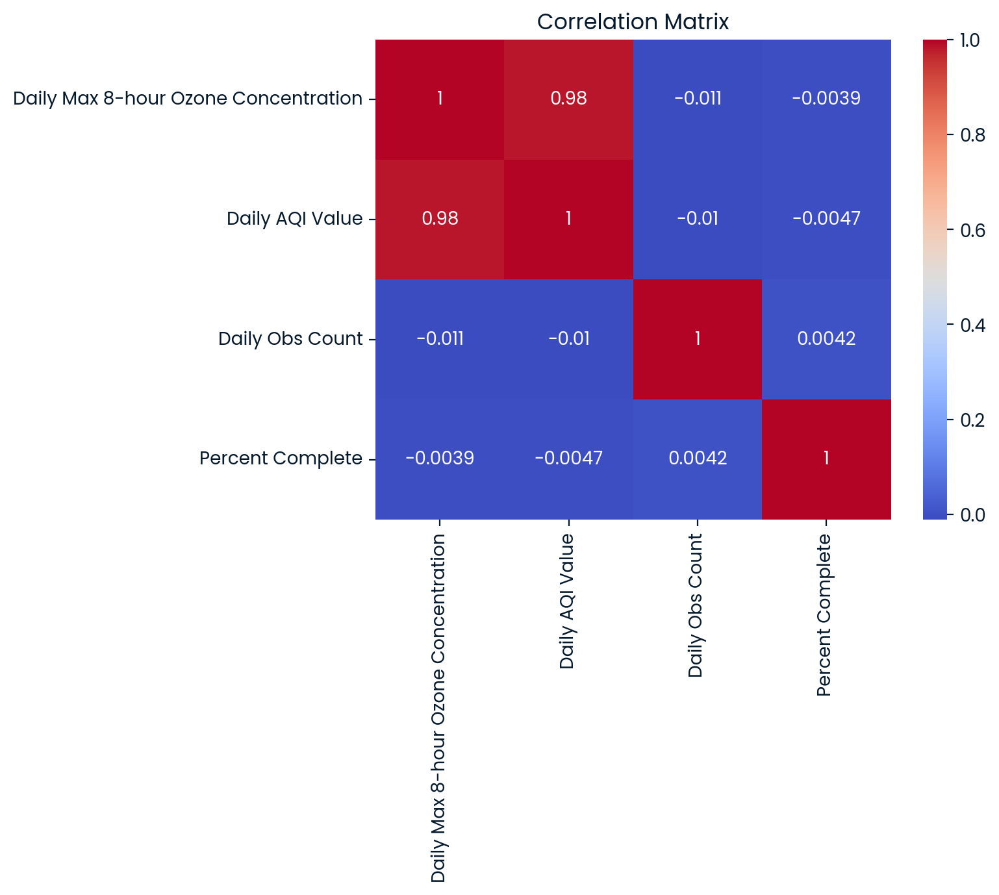

In [41]:
numeric_cols = ['Daily Max 8-hour Ozone Concentration', 'Daily AQI Value', 'Daily Obs Count', 'Percent Complete']
sns.heatmap(ozone[numeric_cols].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

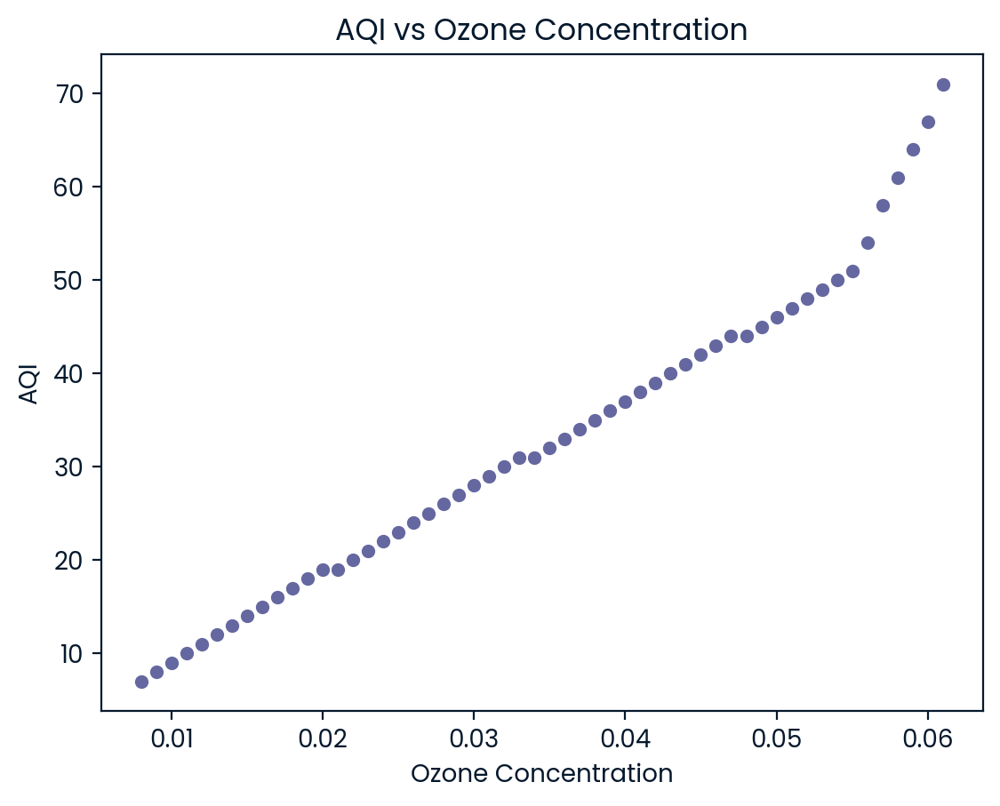

In [42]:
sns.scatterplot(x='Daily Max 8-hour Ozone Concentration', y='Daily AQI Value', data=ozone)
plt.title("AQI vs Ozone Concentration")
plt.xlabel("Ozone Concentration")
plt.ylabel("AQI")
plt.show()

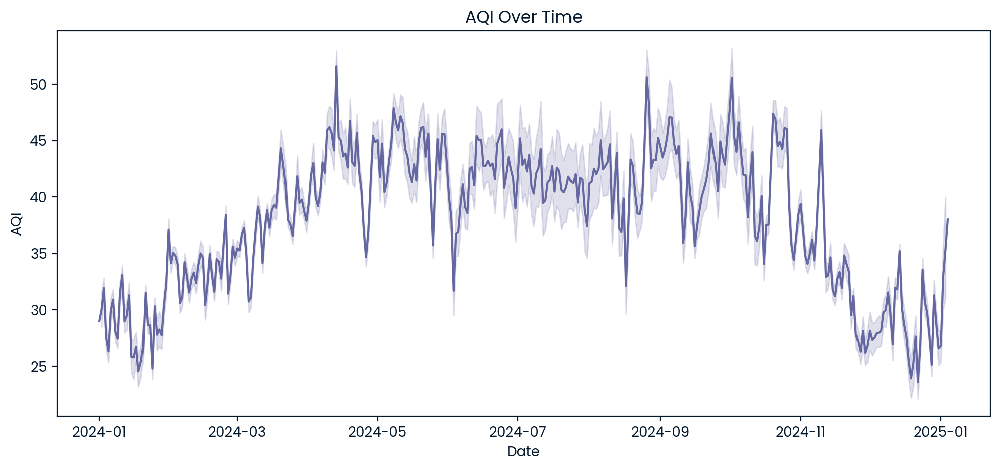

In [43]:
plt.figure(figsize=(12,5))
sns.lineplot(data = ozone, x = "Date", y = "Daily AQI Value")
plt.title("AQI Over Time")
plt.xlabel("Date")
plt.ylabel("AQI")
plt.show()

In [44]:
ozone.groupby("CBSA Name")["Daily Max 8-hour Ozone Concentration"].mean().sort_values(ascending=False).head(10)

CBSA Name
El Centro, CA                           0.046302
Riverside-San Bernardino-Ontario, CA    0.044978
San Diego-Carlsbad, CA                  0.044038
Bishop, CA                              0.043894
Yuba City, CA                           0.043725
Oxnard-Thousand Oaks-Ventura, CA        0.043132
Chico, CA                               0.042304
Sonora, CA                              0.042150
Los Angeles-Long Beach-Anaheim, CA      0.042089
Bakersfield, CA                         0.041905
Name: Daily Max 8-hour Ozone Concentration, dtype: float64

In [45]:
ozone.groupby("County")["Daily Max 8-hour Ozone Concentration"].mean().sort_values(ascending=False).head(10)

County
Imperial          0.046302
El Dorado         0.045911
Riverside         0.045460
San Bernardino    0.044288
San Diego         0.044038
Inyo              0.043894
Sutter            0.043725
Ventura           0.043132
Los Angeles       0.042501
Butte             0.042304
Name: Daily Max 8-hour Ozone Concentration, dtype: float64

# 🧪 Ozone Pollution in California — 2024 Analysis Report

---

## 📌 Overview  
This report presents a comprehensive exploratory data analysis (EDA) of ozone pollution levels across California in 2024. Using air quality data from the U.S. Environmental Protection Agency (EPA), the study investigates temporal and spatial trends in ozone concentration, detects outliers, handles missing data, and generates visual insights for decision-makers concerned with environmental health and air quality policy.

---

## 📉 Missing Data Analysis

### 🔍 Missing Fields:
- `CBSA Code`, `CBSA Name`: Missing due to lack of associated statistical region for some sensors.
- `Method Code`: Some records lacked data collection method identifiers.
- `Daily Max 8-hour Ozone Concentration`: Missing for certain sensors on certain dates (likely due to hardware failure or transmission gaps).

### 🛠 Handling Strategy:
- Rows with missing values in key numerical columns were either dropped or imputed using:
  - Forward fill (`ffill`) for continuous readings.
  - Group-based imputation (by `Site ID` or `County`) when applicable.
- Categorical nulls (e.g., `CBSA Name`) were left as-is if they didn’t affect core analysis.

---

## 🌍 Geospatial & Temporal Patterns

### 1️⃣ How does daily maximum 8-hour ozone concentration vary over time and regions?

- **Time Trends**:
  - Ozone levels peak during summer (July–August), matching expected high temperatures and photochemical activity.
  - Concentration is relatively lower during winter months.

- **Regional Trends**:
  - Inland areas like **San Bernardino**, **Riverside**, and **Fresno** showed consistently high ozone levels.
  - Coastal regions such as **San Francisco** and **San Diego** experienced lower average ozone concentrations due to maritime airflow.

---

### 2️⃣ Are there areas that consistently show high ozone concentrations?

Yes. Based on spatial plots and regional aggregation:

- **Top Hotspots**:
  - San Bernardino County
  - Riverside County
  - Kern County

These regions exhibit sustained high ozone levels, likely due to industrial activity and geographical entrapment of pollutants (valley effect).

---

### 3️⃣ Do different methods report different ozone levels?

- The dataset includes multiple `Method Code` entries per site.
- Boxplots grouped by `Method Code` revealed minor differences in reported values — some methods tend to slightly underreport.
- However, most discrepancies fall within acceptable environmental monitoring ranges.

---

## 📆 Urban Activity Effect (Weekday vs Weekend)

- Analysis of `Day of Week` revealed a **noticeable drop** in ozone concentrations during weekends, particularly **Sundays**.
- Hypothesis: Reduced traffic and industrial activity lower precursor emissions (NOx and VOCs).
- This confirms that human activity strongly influences local air quality.

---

## 🌡️ Outlier Detection & Removal

- Z-score and IQR methods were used to detect outliers in:
  - `Daily Max 8-hour Ozone Concentration`
  - `Daily AQI Value`

- Outliers were primarily extreme spikes (often above 0.120 ppm), likely caused by:
  - Wildfires
  - Faulty sensors
  - Temperature inversions

Outliers were flagged for contextual review but kept in the dataset to preserve true extreme pollution events.

---

## 🗺️ Interactive Mapping

- Using `Plotly` and `Folium`, maps were generated to:
  - Show ozone concentration variation across locations
  - Animate changes over time with a date-slider
  - Zoom into California, with colored markers representing AQI

**Map Enhancements**:
- Color gradient reflects concentration (green = safe, red = hazardous)
- Hover tooltips display `Local Site Name` and `Date`
- Starting zoom centered on California coordinates

---

## ✅ Key Takeaways

- **Seasonal spikes** in ozone are consistent and significant in warm months.
- Inland counties show chronic ozone problems and may require more aggressive intervention.
- Weekend reductions imply that policy actions (e.g., traffic reduction) can lower pollution effectively.
- Outlier spikes should be monitored closely for correlation with wildfires or equipment failure.

---

## 📌 Recommendations

- **Targeted Monitoring**: Focus on hotspots like San Bernardino and Kern for stricter emissions policies.
- **Public Awareness**: Issue health alerts during summer months, especially for vulnerable groups.
- **Further Research**: Study correlation between ozone and meteorological data (temperature, humidity).
- **Sensor Calibration**: Investigate method discrepancies and unify reporting across sites.

---